In [1]:
#!pip install -q fiftyone 
#!pip install -q datumaro 
!sudo apt install -q ffmpeg
!sudo pip install -q imageio-ffmpeg
!pip install -q pytorch-lightning
!pip install -q scikit-learn
!pip install -q transformers


# Machine learning packages
import pandas as pd
import numpy as np
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.autograd import Variable
from torch import sigmoid


import torchvision
from torchvision import transforms
from torchvision import datasets
from torchvision.io import read_image
from torchvision.utils import make_grid
from torchvision.utils import save_image

import pytorch_lightning as pl
from pytorch_lightning import LightningDataModule
from pytorch_lightning.core import datamodule
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import Callback
from pytorch_lightning.loggers import CSVLogger

from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks.progress import TQDMProgressBar
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning import loggers as pl_loggers
from torch.optim.lr_scheduler import ExponentialLR, CosineAnnealingLR
from pytorch_lightning.utilities.model_summary import ModelSummary

from torchmetrics.classification import BinaryAccuracy
from torchmetrics.classification import F1Score
from torchmetrics.classification import MultilabelF1Score as F1


import transformers
from transformers import ViTForImageClassification
from transformers import ViTFeatureExtractor
from transformers import ViTImageProcessor

from transformers import ResNetForImageClassification, ResNetConfig

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

# Standard packages
import gc
import os
import subprocess
import shutil
import json
import random
import string
import imageio
import seaborn as sns
import matplotlib.pyplot as plt
#from IPython.display import Image, set_matplotlib_formats
from PIL import Image, ImageEnhance, ImageOps
import time

Reading package lists...
Building dependency tree...
Reading state information...
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 24.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.4 MB/s eta 0:00:00


To do:

    Augmentation \\\ 
    Freze layers \\\
    Make feature extractor return tensors
    Compare methods for wrong data
    Pretrain a(several) models using places_365
    (Deit, Meit, Dino, MAE)
    # Predict dataloader
    # Understand feature extractor


In [ ]:
#torch.multiprocessing.set_start_method('spawn')

In [2]:
from google.colab import drive 
drive.mount('/content/drive')
drive_path = "/content/drive/MyDrive/export_images_1"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
if torch.cuda.is_available():
  print(torch.cuda.device_count())


In [4]:
#Parameters

SAMPLING_RATE_CAM = 5
SAMPLING_RATE_SEG = 2

%load_ext tensorboard
CHECKPOINT_PATH = os.environ.get("PATH_CHECKPOINT", "saved_models/VisionTransformers/")
pl.seed_everything(42)
plt.set_cmap("cividis")
%matplotlib inline
TENSOR_SHAPE = (224,224)
NUM_WORKERS = 4
ANNOTATION_FILE = "/content/drive/MyDrive/csv_files/photos.csv"

CLASSES = ["Dynamic", "Outdoor", "Boundary", "Constrained", "Uneven", "Road", "Crowd", "Slope"]

p, t = transforms.ToPILImage(), transforms.ToTensor()
pretrained_weight_path = "google/vit-base-patch16-224"


# File locations
test_path = "/content/drive/MyDrive/three_file_test"
cam = "/content/drive/MyDrive/Camera"
seg = "/content/drive/MyDrive/segments"
cam_csv_file = "/content/drive/MyDrive/csv_files/NavigationDataCameraExcel.csv"
seg_csv_file = "/content/drive/MyDrive/csv_files/NavigationDataSegmentsExcel.csv"

new_cam_csv_file = "/content/drive/MyDrive/csv_files/NewNavigationDataCameraExcel.csv"
new_seg_csv_file = "/content/drive/MyDrive/csv_files/NewNavigationDataSegmentsExcel.csv"

photo_csv_file = "/content/drive/MyDrive/csv_files/photos.csv"

INFO:lightning_fabric.utilities.seed:Global seed set to 42


<Figure size 640x480 with 0 Axes>

# CVAT, Fifyyone and Datumaro

In [ ]:
import fiftyone as fo


# printing lowercase
letters = string.ascii_lowercase

name = ''.join(random.choice(letters) for i in range(10))
dataset_dir = drive_path
#"/content/drive/MyDrive/task_one_dataset"

# Create the dataset
dataset = fo.Dataset.from_dir(
    dataset_dir=dataset_dir,
    dataset_type=fo.types.CVATImageDataset,
    name=name
)

# View summary info about the dataset
print(dataset)

# Print the first few samples in the dataset
print(dataset.head(3))

dataset

In [ ]:
f = fo.utils.cvat.CVATImageDatasetImporter(dataset_dir=None,
                                       data_path="/content/drive/MyDrive/export_images_1/data", 
                                       labels_path="/content/drive/MyDrive/export_images_1/labels", 
                                       include_all_data=False,
                                       shuffle=False, 
                                       seed=None, 
                                       max_samples=None)



In [ ]:
import datumaro as dm

d_path = "/content/drive/MyDrive/datumaro"
dataset = dm.Dataset.import_from(d_path, 'datumaro')

# keep only annotated images
dataset.select(lambda item: len(item.annotations) != 0)

# iterate over the dataset elements
for item in dataset:
    print(item.id, item.annotations)
    print(item.media)
    i = item 
    break



A_Jacal_AHG_Library_Thu_Oct_28_1035 [Label(id=0, attributes={}, group=0, label=2), Label(id=0, attributes={}, group=0, label=0)]


In [ ]:
Image(i.media)


In [ ]:
print(type(i.media))

<class 'datumaro.components.media.Image'>


In [ ]:

  
# Opening JSON file
f = open('default.json')

data = json.load(f)
  
# Iterating through the json
# list

for i in data.keys():
    print(i)
    for item in data[i]:
        #print(item)
        break

print("")

k1, k2, k3 = data.keys()



# Closing file
f.close()



info
categories
items

{'label': {'labels': [{'name': 'Static', 'parent': '', 'attributes': []}, {'name': 'Dynamic', 'parent': '', 'attributes': []}, {'name': 'Outside', 'parent': '', 'attributes': []}, {'name': 'Inside', 'parent': '', 'attributes': []}, {'name': 'Single', 'parent': '', 'attributes': []}, {'name': 'Double', 'parent': '', 'attributes': []}, {'name': 'Narrow', 'parent': '', 'attributes': []}, {'name': 'Uneven', 'parent': '', 'attributes': []}, {'name': 'Crowd', 'parent': '', 'attributes': []}, {'name': 'Road', 'parent': '', 'attributes': []}, {'name': 'Slopes', 'parent': '', 'attributes': []}], 'attributes': ['occluded']}, 'points': {'items': []}}


In [ ]:
a, b = data[k2].keys()

label = data[k2].get(a)
points = data[k2].get(b)
labels = [item["name"] for item in label["labels"]]

In [ ]:

for frame in data[k3]:
    annotations = frame.get('annotations')
    if len(annotations) != 0:
        label_ids = [l["label_id"] for l in annotations]
        frameLabels = [labels[x] for x in label_ids]

        print(frame.get("id"), frameLabels)

# START

In [5]:
path = seg
csv_file = seg_csv_file
to_path = new_seg_csv_file

def read_video_dataset(fileName):
    df = pd.read_csv(fileName)
    df["FileName"].replace(' ', np.nan, inplace=True)
    df = df[df["FileName"].str.strip().astype(bool)]
    df.dropna(subset=["FileName"], inplace = True)
    df.sort_index(inplace = True)
    return df

df = read_video_dataset(csv_file)


Test opperation

In [ ]:
df = df.head(3)
path = test_path

To do:
NN:
    Vision transformer
    EfficentNet
    ResNet
Datasets:
    Kitty
    Cityscapes
    Imagenet


In [ ]:
df.head(10)
#result = [f(x, y) for x, y in zip(df['col1'], df['col2'])]

,FileName,Condition,Length sek,Frames,Static,Dynamic,Indoor,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope,Single
0,59_A_Jackal_AHG_Library_Thu_Oct_28_1_dynamic_b...,Day,NaN,NaN,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0
1,60_A_Jackal_AHG_Library_Thu_Oct_28_1_dynamic_l...,Day,NaN,NaN,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0
2,61_A_Jackal_AHG_Library_Thu_Oct_28_1_dynamic_w...,Day,NaN,NaN,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0


Check if files exist

In [ ]:
for fileName in df["FileName"]:
    filePath = os.path.join(path, fileName)
    if not os.path.isfile(filePath):
        print(fileName)
    

Get video information using subprocess ffprobe




In [ ]:
def video_length_seconds(filename):
    result = subprocess.run(
        [
            "ffprobe",
            "-v",
            "error",
            "-show_entries",
            "format=duration",
            "-of",
            "default=noprint_wrappers=1:nokey=1",
            "--",
            filename,
        ],
        capture_output=True,
        text=True,
    )
    try:
        return float(result.stdout)
    except ValueError:
        raise ValueError(result.stderr.rstrip("\n"))

def get_video_info(fileloc) :

    command = ['ffprobe',
               '-v', 'fatal',
               '-show_entries', 'stream=width,height,r_frame_rate,duration',
               '-of', 'default=noprint_wrappers=1:nokey=1',
               fileloc, '-sexagesimal']
    ffmpeg = subprocess.Popen(command, stderr=subprocess.PIPE ,stdout = subprocess.PIPE )
    out, err = ffmpeg.communicate()
    if(err) : print(err)
    out = out.decode('UTF-8').split('\n')
    return {'file' : fileloc,
            'width': int(out[0]),
            'height' : int(out[1]),
            'fps': float(out[2].split('/')[0])/float(out[2].split('/')[1]),
            'duration' : out[3] }

def get_video_frame_count(fileloc) : 
    command = ['ffprobe',
               '-v', 'fatal',
               '-count_frames',
               '-show_entries', 'stream=nb_read_frames',
               '-of', 'default=noprint_wrappers=1:nokey=1',
               fileloc, '-sexagesimal']
    ffmpeg = subprocess.Popen(command, stderr=subprocess.PIPE ,stdout = subprocess.PIPE )
    out, err = ffmpeg.communicate()
    if(err) : print(err)
    out = out.decode('UTF-8').split('\n')
    return out[0]




In [ ]:
def wrapper_video_length(fileName):
    filePath = os.path.join(path, fileName)
    if os.path.isfile(filePath):
        return video_length_seconds(filePath)

def wrapper_get_video_info(fileName):
    filePath = os.path.join(path, fileName)
    if os.path.isfile(filePath):
        return get_video_info(filePath)

def wrapper_get_video_frame_count(fileName):
    filePath = os.path.join(path, fileName)
    if os.path.isfile(filePath):
        return int(get_video_frame_count(filePath))

def wrapper_io_frame_count(fileName):
    filePath = os.path.join(path, fileName)

    if os.path.isfile(filePath):
        reader = imageio.get_reader(filePath)
        return reader.count_frames()

def wrapper_io_frame_itter_count(fileName):
    filePath = os.path.join(path, fileName)

    if os.path.isfile(filePath):
        reader = imageio.get_reader(filePath)
        iterable = enumerate(reader)
        s = sum(1 for _ in iterable)
        return s

In [ ]:
df["Length sek"] = df["FileName"].apply(wrapper_video_length)
df["Frames"] = df["FileName"].apply(wrapper_io_frame_itter_count)

In [ ]:
#df.to_csv(to_path, index = False)

# Read Video Dataset

In [6]:
# Creating a copy of video folders for sampling photos

source_dir = r"/content/drive/MyDrive/segments"
segments_copy = r"/content/drive/MyDrive/segments_copy"
#shutil.copytree(source_dir, destination_dir)

source_dir = r"/content/drive/MyDrive/Camera"
camera_copy = r"/content/drive/MyDrive/Camera_copy"
#shutil.copytree(source_dir, destination_dir)

In [7]:
df_cam = read_video_dataset(new_cam_csv_file)
df_seg = read_video_dataset(new_seg_csv_file)
df_cam["photo_path"] = camera_copy
df_seg["photo_path"] = segments_copy
df = pd.concat([df_cam, df_seg], ignore_index=True, axis=0)


In [ ]:
#Error missing column
df.at[len(df) -1, 'Dynamic' ] = 1
df.at[len(df) -1, 'Indoor' ] = 1

In [8]:
s = df_cam["Frames"]/df_cam["Length sek"]
s = s.round().astype(int)
print(s.value_counts())


s = df_seg["Frames"]/df_seg["Length sek"]
s = s.round().astype(int)
print(s.value_counts())

30     55
120     3
dtype: int64
60    47
dtype: int64


In [9]:
print(int(df_cam["Length sek"].sum()), int(df_seg["Length sek"].sum()), "seconds")
print(int(df_cam["Length sek"].sum()/60), int(df_seg["Length sek"].sum())/60, "minuttes")
print(int(df_cam["Frames"].sum()), int(df_seg["Frames"].sum()), "Frames")

1505 324 seconds
25 5.4 minuttes
50754 19490 Frames


In [10]:
df

,FileName,Condition,Length sek,Frames,Static,Dynamic,Indoor,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope,Single,photo_path
0,1_night_constrained.mp4,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy
1,2_night_treepath.mp4,Night,21.535,645,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy
2,3_night_slope.mp4,Night,10.292,1235,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,1,0,/content/drive/MyDrive/Camera_copy
3,4_night_constrained.mp4,Night,39.762,1192,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy
4,5_night_road.mp4,Night,106.023,3182,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0,0,/content/drive/MyDrive/Camera_copy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,101_A_Spot_LBJ_Stadium_Sat_Nov_13_105_dynamic_...,Day,8.800,528,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy
101,102_A_Spot_LBJ_Stadium_Sat_Nov_13_105_dynamic_...,Day,6.200,372,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy
102,103_A_Spot_Lbj_Thompson_Sat_Nov_13_99_dynamic_...,Day,8.400,504,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy
103,104_A_Spot_Library_AHG_Fri_Nov_12_86_dynamic_o...,Day,18.517,1111,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy


In [ ]:
p = "/content/drive/MyDrive/a_video"
f = "jack.mkv"

filePath = os.path.join(p, f)
source = os.path.join(segments_copy, df_seg.loc[0]["FileName"])

reader = imageio.get_reader(filePath)

head, sep, tail = f.partition('.')

for frame_number, im in enumerate(reader):
    
    img_name = head + "_" + str(frame_number).zfill(5) + ".png"

                
    img_path_name = os.path.join(p, img_name)
    imageio.imwrite(img_path_name, im)
reader.close()

# Sample photos and create dataset

In [ ]:
cols = df.columns.tolist()
cols += ["Frame_nr", "original_index"]

photos = pd.DataFrame(columns=cols)

for index, row in df.iterrows():

    nr_of_frames = int(row["Frames"])

    fileName = str(row["FileName"])
    head, sep, tail = fileName.partition('.')

    base_row = row[1:].tolist()
    
    if str(row["photo_path"]) == str(camera_copy):
        sampling_rate = SAMPLING_RATE_CAM
    elif str(row["photo_path"]) == str(segments_copy):
        sampling_rate = SAMPLING_RATE_SEG
    else:
        print("Error")

    for i in range(0, nr_of_frames, sampling_rate):

        name = head + "_" + str(i).zfill(5) + ".png"

        new_row = [name] + base_row + [int(i)] + [index]
        photos = pd.concat([pd.DataFrame([new_row], columns=photos.columns), photos], ignore_index=True)

photos = photos.reindex(index=photos.index[::-1]).reset_index(drop = True)

In [ ]:
photos.to_csv(photo_csv_file)

In [ ]:
photos

,FileName,Condition,Length sek,Frames,Static,Dynamic,Indoor,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope,Single,photo_path,Frame_nr,original_index
0,1_night_constrained_00000.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,0,0
1,1_night_constrained_00005.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,5,0
2,1_night_constrained_00010.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,10,0
3,1_night_constrained_00015.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,15,0
4,1_night_constrained_00020.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,20,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19918,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,506,104
19919,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,508,104
19920,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,510,104
19921,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,512,104


In [ ]:
s2 = photos["Static"].astype(int) ^ photos["Dynamic"].astype(int)
s2.value_counts()



1    19665
0      258
dtype: int64

In [ ]:
generated_files = []

for path, fileName in zip(df["photo_path"], df["FileName"]):

    filePath = os.path.join(path, fileName)
    reader = imageio.get_reader(filePath)

    head, sep, tail = fileName.partition('.')

    if str(path) == str(camera_copy):
        sampling_rate = SAMPLING_RATE_CAM
    elif str(path) == str(segments_copy):
        sampling_rate = SAMPLING_RATE_SEG
    else:
        print("Error")

    for frame_number, im in enumerate(reader):
        if frame_number % sampling_rate == 0:
            img_name = head + "_" + str(frame_number).zfill(5) + ".png"
            generated_files.append(img_name)
            
            img_path_name = os.path.join(path, img_name)
            #imageio.imwrite(img_path_name, im)

    reader.close()
    #os.remove(filePath)

In [ ]:
files = os.listdir(segments_copy) + os.listdir(camera_copy)
df_items = photos.FileName.tolist()
in_dir_not_in_df = list(set(files) - set(df_items))
in_df_not_in_dir = list(set(df_items) - set(files))
print(len(in_dir_not_in_df))
print(len(in_df_not_in_dir))


106
0


In [ ]:
len(photos)

19923

In [ ]:
file_names = photos.FileName.tolist()

array = [not(x == y) for x, y in zip(file_names, generated_files)]



In [ ]:
print(np.sum(df.Frames.astype(int).tolist()))
print(len(photos))
print(len(generated_files))
print(generated_files)

2528
507
692
['1_night_constrained_00000.png', '1_night_constrained_00005.png', '1_night_constrained_00010.png', '1_night_constrained_00015.png', '1_night_constrained_00020.png', '1_night_constrained_00025.png', '1_night_constrained_00030.png', '1_night_constrained_00035.png', '1_night_constrained_00040.png', '1_night_constrained_00045.png', '1_night_constrained_00050.png', '1_night_constrained_00055.png', '1_night_constrained_00060.png', '1_night_constrained_00065.png', '1_night_constrained_00070.png', '1_night_constrained_00075.png', '1_night_constrained_00080.png', '1_night_constrained_00085.png', '1_night_constrained_00090.png', '1_night_constrained_00095.png', '1_night_constrained_00100.png', '1_night_constrained_00105.png', '1_night_constrained_00110.png', '1_night_constrained_00115.png', '1_night_constrained_00120.png', '1_night_constrained_00125.png', '1_night_constrained_00130.png', '1_night_constrained_00135.png', '1_night_constrained_00140.png', '1_night_constrained_00145.pn

In [ ]:
l1 = df["FileName"].apply(wrapper_get_video_frame_count).tolist()
l2 = df["FileName"].apply(wrapper_io_frame_count).tolist()
all([(x == y) for x, y in zip(l1, l2)])

True

In [ ]:
# Remove videos

for path, fileName in zip(df["photo_path"], df["FileName"]):

    filePath = os.path.join(path, fileName)
    os.remove(filePath)

# Distribution of classes

In [ ]:
np.mean(df_cam.Frames), np.mean(df_seg.Frames)

(875.0689655172414, 414.6808510638298)

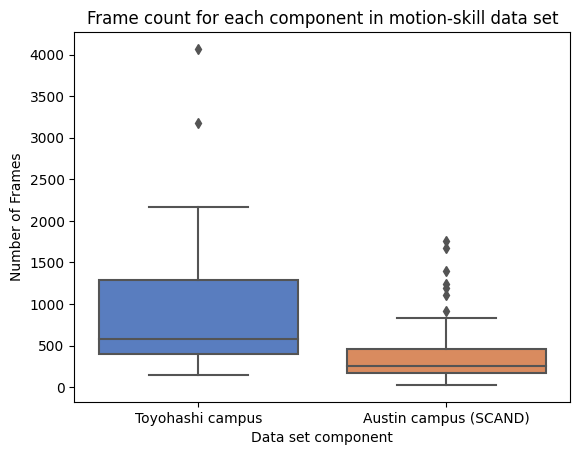

In [ ]:
fig, ax = plt.subplots()
df["component_name"] = df.photo_path.map({camera_copy:"Toyohashi campus", segments_copy:"Austin campus (SCAND)"})
ax = sns.boxplot(data=df, x="component_name", y="Frames", palette = "muted")

title = "Frame count for each component in motion-skill data set"
ax.set_title(title)

ax.set_xlabel("Data set component")
ax.set_ylabel("Number of Frames")
plt.savefig(fname = "frames.png", format = "png")

plt.show()

In [ ]:

#define Seaborn color palette to use
colors = sns.color_palette('bright')

dynamic = dict(zip(['Dynamic', 'Static'],[df["Dynamic"].sum(), df["Static"].sum()]))
boundary = dict(zip(['Boundary', 'No boundary'],[df["Boundary"].sum(), len(df) - df["Boundary"].sum()]))
constrained = dict(zip(['Constrained', 'Not Constrained'], [df["Constrained"].sum(), len(df) - df["Constrained"].sum()]))
uneven = dict(zip(['Uneven', 'Not Uneven'], [df["Uneven"].sum(), len(df) - df["Uneven"].sum()]))
road = dict(zip(['Road', 'Not road'], [df["Road"].sum(), len(df) - df["Road"].sum()]))
crowd = dict(zip(['Crowd', 'No Crowd'], [df["Crowd"].sum(), len(df) - df["Crowd"].sum()]))
slope = dict(zip(['Slope', 'No Slope'], [df["Slope"].sum(), len(df) - df["Slope"].sum()]))
outdoor = dict(zip(['Outdoor', 'Indoor'],[df["Outdoor"].sum(), df["Indoor"].sum()]))


dicts = [dynamic, boundary, constrained, uneven, slope, outdoor]
#create pie chart
fig, axs = plt.subplots(2, 3, figsize = (10, 10))
for i in range(2):
    for j in range(3):
        count = i*3 + j
        n = dicts[count]
        axs[i,j].pie(n.values(), labels=n.keys(), colors = colors[count : count * 2 + 2], autopct='%.0f%%')
plt.show()



{'Dynamic': 0.42857142857142855,
 'Static': 0.5714285714285714,
 'Outdoor': 0.8571428571428571,
 'Indoor': 0.14285714285714285,
 'Boundary': 0.4857142857142857,
 'Constrained': 0.24761904761904763,
 'Uneven': 0.08571428571428572,
 'Road': 0.02857142857142857,
 'Slope': 0.08571428571428572}

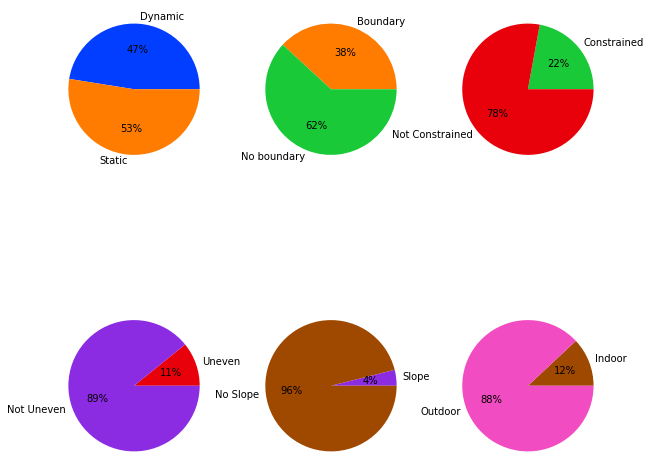

In [ ]:
dynamic = dict(zip(['Dynamic', 'Static'],[photos["Dynamic"].sum(), photos["Static"].sum()]))
boundary = dict(zip(['Boundary', 'No boundary'],[photos["Boundary"].sum(), len(photos) - photos["Boundary"].sum()]))
constrained = dict(zip(['Constrained', 'Not Constrained'], [photos["Constrained"].sum(), len(photos) - photos["Constrained"].sum()]))
uneven = dict(zip(['Uneven', 'Not Uneven'], [photos["Uneven"].sum(), len(photos) - photos["Uneven"].sum()]))
road = dict(zip(['Road', 'Not road'], [photos["Road"].sum(), len(photos) - photos["Road"].sum()]))
crowd = dict(zip(['Crowd', 'No Crowd'], [photos["Crowd"].sum(), len(photos) - photos["Crowd"].sum()]))
slope = dict(zip(['Slope', 'No Slope'], [photos["Slope"].sum(), len(photos) - photos["Slope"].sum()]))
outdoor = dict(zip(['Outdoor', 'Indoor'],[photos["Outdoor"].sum(), photos["Indoor"].sum()]))

dicts = [dynamic, boundary, constrained, uneven, slope, outdoor]
#create pie chart
fig, axs = plt.subplots(2, 3, figsize = (10, 10))
for i in range(2):
    for j in range(3):
        count = i*3 + j
        n = dicts[count]
        axs[i,j].pie(n.values(), labels=n.keys(), colors = colors[count : count * 2 + 2], autopct='%.0f%%')
plt.show()

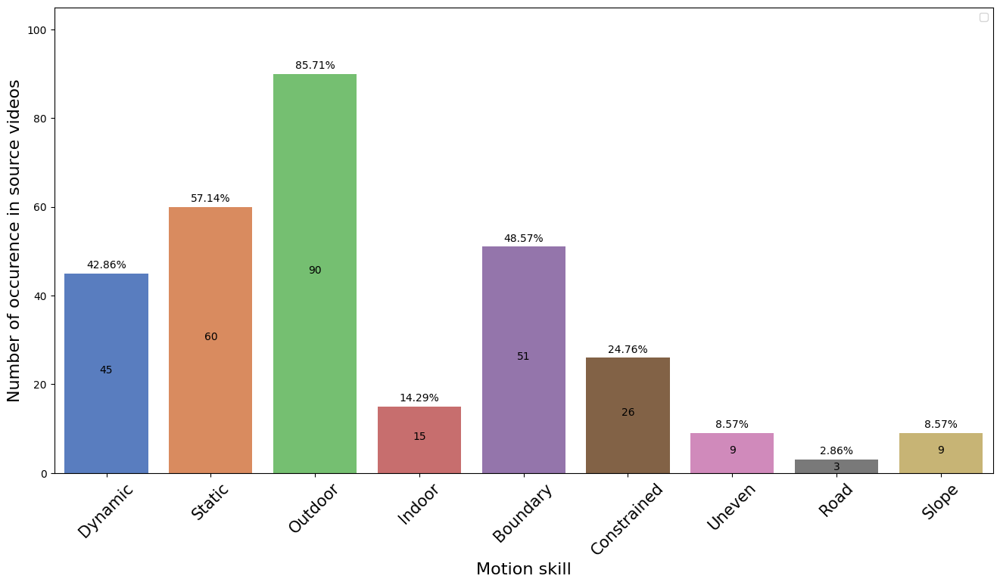

In [ ]:
classes = ['Dynamic',"Static",'Outdoor', "Indoor", 'Boundary','Constrained','Uneven','Road','Slope'] 
my_dict = {}
for c in classes:
    my_dict[c] = df[c].sum() #/len(df)


keys = list(my_dict.keys())
vals = [my_dict[k] for k in keys]
perc = [v/len(df) for v in vals]

fig, ax = plt.subplots(figsize = (16, 8))

colors = sns.color_palette('dark')
ax = sns.barplot(x = keys, y = vals, palette = "muted") #colors = colors[:len(classes)]

title = "Occurence of labels in videos from motion-skill data set"
#ax.set_title(title, size = 20)

ax.legend()
ax.set_xlabel("Motion skill", size = 16)
ax.set_ylabel("Number of occurence in source videos", size = 16)
ax.set_ylim([0, 105])

for i, p in enumerate(ax.containers[0]):

    ax.annotate(f'{perc[i]:.2%}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
    if i == len(vals) -2:
        height = p.get_height() / 4
    else: 
        height = p.get_height() / 2
    ax.annotate(f'{vals[i]:.0f}', (p.get_x() + p.get_width() / 2., height), ha='center', va='baseline', fontsize=10, color='black')

plt.xticks(fontsize=15, rotation=45)

title = title.replace(" ", "_") + ".png"
plt.savefig(fname = title, format = "png")
plt.savefig(title.replace(".png", ".svg"), format='svg', dpi=1200)
plt.show()

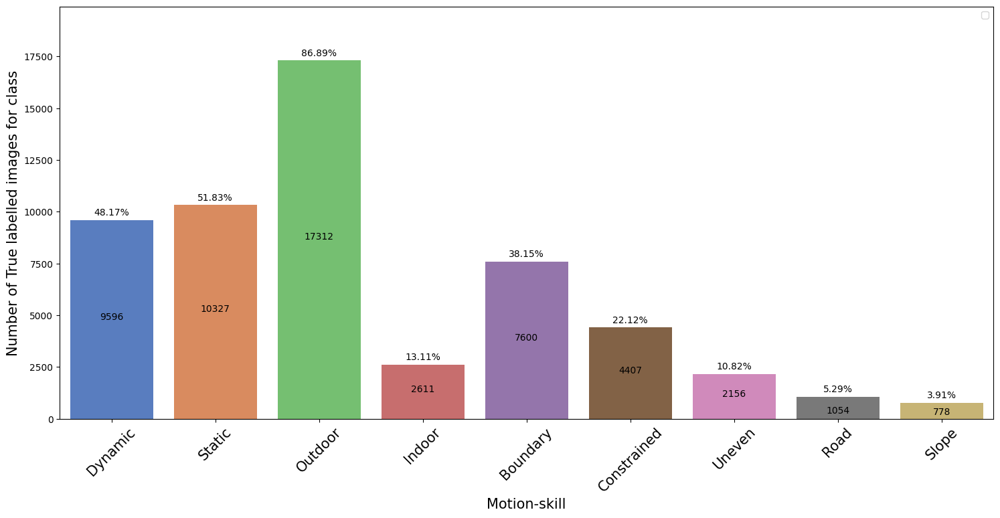

In [ ]:
classes = ['Dynamic',"Static",'Outdoor', "Indoor", 'Boundary','Constrained','Uneven','Road','Slope'] 
photos = pd.read_csv(photo_csv_file, index_col = 0)

p_dict = {}
for c in classes:
    p_dict[c] = photos[c].sum()

keys = list(p_dict.keys())
vals = [p_dict[k] for k in keys]
perc = [v/len(photos) for v in vals]

fig, ax = plt.subplots(figsize = (18, 8))

colors = sns.color_palette('dark')
ax = sns.barplot(x = keys, y = vals, palette = "muted", ) #colors = colors[:len(classes)]

title = "Occurence of each labels image motion-skill data set"
#ax.set_title(title, size = 20)

ax.legend()
axis_font = {'fontname':'Arial', 'size':'14'}
ax.set_xlabel("Motion-skill", size = 15)
ax.set_ylabel("Number of True labelled images for class", size = 15)
ax.set_ylim([0, len(photos)])

for i, p in enumerate(ax.containers[0]):

    ax.annotate(f'{perc[i]:.2%}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
    if i >= len(vals) -2:
        height = p.get_height() / 4
    else: 
        height = p.get_height() / 2
    ax.annotate(f'{vals[i]:.0f}', (p.get_x() + p.get_width() / 2., height), ha='center', va='baseline', fontsize=10, color='black')

plt.xticks(fontsize=15, rotation=45)

title = title.replace(" ", "_") + ".png"
plt.savefig(fname = title, format = "png")
plt.savefig(title.replace(".png", ".svg"), format='svg', dpi=1200)

plt.show()

In [ ]:
d = pd.DataFrame(data={"Video data set": [my_dict[k]/len(df) for k in classes], "Image data set": [p_dict[k] for k in classes]}, index=classes, columns=["Video data set", "Image data set"], dtype=float)
d.transpose().style.format("{:.2%}")


,Dynamic,Static,Outdoor,Indoor,Boundary,Constrained,Uneven,Road,Slope
Video data set,42.86%,57.14%,85.71%,14.29%,48.57%,24.76%,8.57%,2.86%,8.57%
Image data set,48.17%,51.83%,86.89%,13.11%,38.15%,22.12%,10.82%,5.29%,3.91%


In [ ]:
    s1 = df.loc[train_idx][CLASSES].sum()
s2 = df.loc[val_idx][CLASSES].sum()
s3 = df.loc[test_idx][CLASSES].sum()



count_vids = pd.DataFrame({'train': s1,'val':s2, 'test':s3, 'idx_col':s1.index})
count_vids.transpose()

,Dynamic,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope
train,38.0,72.0,42.0,20.0,7.0,2.0,0.0,7.0
val,4.0,7.0,5.0,3.0,1.0,0.0,0.0,1.0
test,3.0,11.0,4.0,3.0,1.0,1.0,0.0,1.0
idx_col,Dynamic,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope


## Which images can the neural network recognize

In [11]:
photos = pd.read_csv(photo_csv_file, index_col = 0)

In [13]:
img_idx = np.load('/content/test.npy')


In [52]:
decreasing_loss = []
increasing_loss = []

used_vids = []
for i in img_idx:
    idx_new = photos.loc[i]['original_index']

    if idx_new not in used_vids:
        used_vids.append(idx_new)

        decreasing_loss.append(i)

used_vids = []
for i in reversed(img_idx):
    idx_new = photos.loc[i]['original_index']

    if idx_new not in used_vids:
        used_vids.append(idx_new)

        increasing_loss.append(i)

photos_d = photos.loc[decreasing_loss][['photo_path', 'FileName']]
photos_i = photos.loc[increasing_loss][['photo_path', 'FileName']]

d = photos_d.apply(lambda x: os.path.join(x.photo_path, x.FileName), axis=1)
i = photos_i.apply(lambda x: os.path.join(x.photo_path, x.FileName), axis=1)

d = [Image.open(x) for x in d]
i = [Image.open(x) for x in i]

t1 = transforms.Resize((224, 448))

d = [t1(x) for x in d]
i = [t1(x) for x in i]

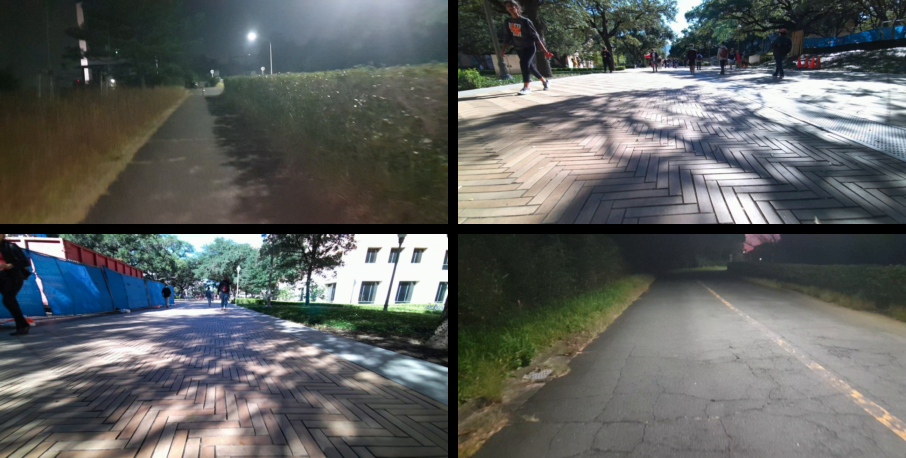

In [80]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    space = 10
    grid = Image.new('RGB', size=(cols*w + space, rows*h + space))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        x = [(0,0), (w+space, 0), (0, h + space), (w+space, h+space)]
        grid.paste(img, box=x[i])
    return grid

grid1 = image_grid(random.sample(d[:10], 4), 2, 2)
grid1

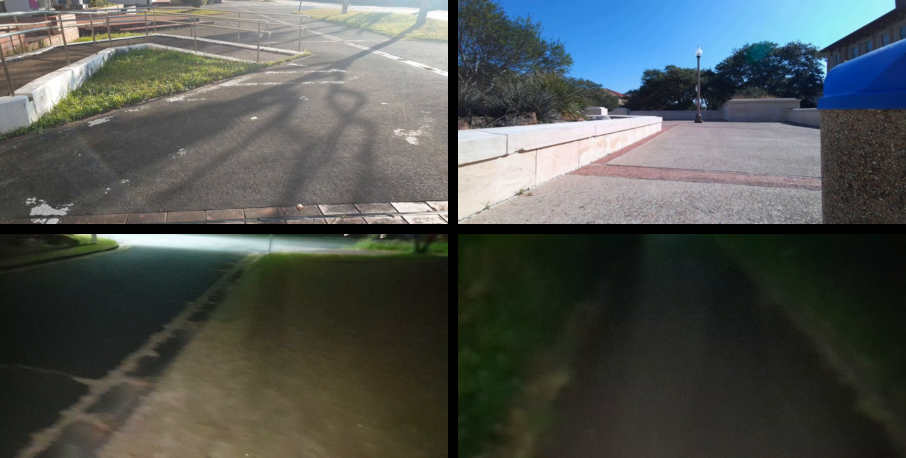

In [96]:
grid1 = image_grid(random.sample(i[:6], 4), 2, 2)
grid1

# Machine learning

In [ ]:
EPOCHS = 3
BATCH_SIZE = 16
LEARNING_RATE = 1e-5

In [12]:
photos = pd.read_csv(photo_csv_file, index_col = 0)
thresholds = [photos[k].sum()/len(photos) for k in CLASSES]
df['strat'] = df['Uneven'].astype(str) + df['Slope'].astype(str)
train_idx, test_idx = train_test_split(df.index, test_size=0.1, random_state =32, stratify=df['strat'])
train_idx, val_idx = train_test_split(train_idx, test_size=0.1, random_state = 32, stratify=df.loc[train_idx]['strat'])
train_idx, val_idx, test_idx = list(train_idx), list(val_idx), list(test_idx)

In [ ]:
#photos.loc[(1,2,3), 'max_speed'] = (30,20,3)
photos

,FileName,Condition,Length sek,Frames,Static,Dynamic,Indoor,Outdoor,Boundary,Constrained,Uneven,Road,Crowd,Slope,Single,photo_path,Frame_nr,original_index
0,1_night_constrained_00000.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,0,0
1,1_night_constrained_00005.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,5,0
2,1_night_constrained_00010.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,10,0
3,1_night_constrained_00015.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,15,0
4,1_night_constrained_00020.png,Night,52.648,1578,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,/content/drive/MyDrive/Camera_copy,20,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19918,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,506,104
19919,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,508,104
19920,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,510,104
19921,105_A_Spot_Library_MLK_Thu_Nov_18_122_inside_d...,Day,8.600,516,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,/content/drive/MyDrive/segments_copy,512,104


In [ ]:
size = (224, 224)
mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
#mean, std = [0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784]

test_transform = transforms.Compose([
                                    transforms.Resize(size),     
                                    transforms.ToTensor(),  
                                    transforms.Normalize(mean, std)])



train_transform = transforms.Compose([
                                    transforms.Resize(size),  
                                    transforms.RandomHorizontalFlip(),
                                    transforms.RandomResizedCrop((32, 32), scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                                    transforms.ToTensor(),  
                                    transforms.Normalize(mean, std)])


auto_transform = transforms.Compose([
                                    transforms.Resize(size),  
                                    transforms.AugMix(severity = 3, mixture_width= 3, chain_depth = - 1, alpha = 1.0),
                                    transforms.ToTensor(),  
                                    transforms.Normalize(mean, std)])

# Add augmentation
imageProcessor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k") 

def collate_fn(data):
    
    images, labels, idxs = zip(*data)

    labels = torch.vstack(labels)

    images = imageProcessor(images, return_tensors="pt")
    images = torch.squeeze(images['pixel_values'])
    
    return images, labels, idxs

In [ ]:
idx = 11
p, n = photos.iloc[idx, [photos.columns.get_loc(c) for c in ['photo_path', 'FileName']]]
img_path = os.path.join(p, n)
image = read_image(img_path).float()
image = test_transform(image)
f = imageProcessor(image, return_tensors="pt")
f['pixel_values']

In [ ]:
idx = 10000
p, n = photos.iloc[idx, [photos.columns.get_loc(c) for c in ['photo_path', 'FileName']]]
img_path = os.path.join(p, n)

image = read_image(img_path)
image2 = Image.open(img_path)

type(image), type(image2)

(torch.Tensor, PIL.PngImagePlugin.PngImageFile)

In [ ]:
class TorchDataset(Dataset):
    def __init__(self, annotations_file, transform, idx_file, apply_imageProcessor = False):

        self.img_labels = pd.read_csv(annotations_file)
        self.img_labels = self.img_labels[self.img_labels["original_index"].isin(idx_file)]
        
        self.transform = transform
        self.apply_imageProcessor = apply_imageProcessor

        print("Transform type: ", type(self.transform))

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):

        p, n = photos.iloc[idx, [photos.columns.get_loc(c) for c in ['photo_path', 'FileName']]]
        img_path = os.path.join(p, n)

        #image = read_image(img_path).float() as tensor
        image = Image.open(img_path)

        if self.transform is not None:
           image = self.transform(image)

        if self.apply_imageProcessor:
            image = imageProcessor(image, return_tensors="pt")
            image = torch.squeeze(image['pixel_values']) # if dim 3

        label = self.img_labels.iloc[idx]
        label = label[CLASSES]
        new_label = torch.as_tensor(label , dtype=torch.float)
        new_label = new_label

        return image, new_label, idx

    def getImage(self, idx):
        return self.__getitem__(idx)[0]
    def getLabel(self, idx):
        return self.__getitem__(idx)[1]

In [ ]:
# Testing difference between applying collate function to batch and applying feature transform to single images

dataset_collate = TorchDataset(annotations_file = ANNOTATION_FILE, transform = None, idx_file = train_idx)
dataloader_collate = torch.utils.data.DataLoader(dataset_collate, batch_size=BATCH_SIZE, shuffle=True, collate_fn = collate_fn)

dataset_single = TorchDataset(annotations_file = ANNOTATION_FILE, transform = None, idx_file = train_idx, apply_imageProcessor =True)
dataloader_single = torch.utils.data.DataLoader(dataset_single, batch_size=BATCH_SIZE, shuffle=True)

dataset_auto = TorchDataset(annotations_file = ANNOTATION_FILE, transform = auto_transform, idx_file = train_idx)
dataloader_auto = torch.utils.data.DataLoader(dataset_auto, batch_size=BATCH_SIZE, shuffle=True)


start = time.time()
X, y, idxs = next(iter(dataloader_collate))
time_collate = time.time() - start 

start = time.time()
X, y, idxs = next(iter(dataloader_single))
time_single = time.time() - start 

start = time.time()
X_, y_, idxs_ = next(iter(dataloader_auto))
time_auto = time.time() - start 

print("Time when applying imageProcessor to batch of {}: ".format(BATCH_SIZE), round(time_collate, 4))
print("Time when applying imageProcessor individually to batch of {}: ".format(BATCH_SIZE), round(time_single, 4))
print("Time when applying auto augmentation to batch of {}: ".format(BATCH_SIZE), round(time_auto, 4))

Transform type:  <class 'NoneType'>
Transform type:  <class 'NoneType'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Time when applying imageProcessor to batch of 16:  7.4611
Time when applying imageProcessor individually to batch of 16:  7.5348
Time when applying auto augmentation to batch of 16:  8.1204


In [ ]:
class LightningWrapper(LightningDataModule):


    def __init__(self, annotation_file, batch_size, size = (224, 224)):
      
        super().__init__()

        self.annotation_file = annotation_file

        self.batch_size = batch_size

        auto_transform, test_transform = self.augment_and_transform(size)
        self.train_transform = auto_transform
        self.test_transform = test_transform
        
        self.collate_fn = None

    def prepare_data(self):
        
        self.train = TorchDataset(self.annotation_file, self.train_transform, train_idx)

        self.val = TorchDataset(self.annotation_file, self.test_transform, val_idx)
        self.test = TorchDataset(self.annotation_file, self.test_transform, test_idx)
        self.predict = TorchDataset(self.annotation_file, self.test_transform, list(df.index))

    def setup(self, stage=None):
        return ###

    def augment_and_transform(self, size = (224, 224)):

        mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
        
        auto_transform = transforms.Compose([
                                            transforms.Resize(size),  
                                            transforms.AugMix(severity = 3, mixture_width= 3, chain_depth = - 1, alpha = 1.0),
                                            transforms.ToTensor(),  
                                            transforms.Normalize(mean, std)])

        test_transform = transforms.Compose([
                                            transforms.Resize(size),     
                                            transforms.ToTensor(),  
                                            transforms.Normalize(mean, std)])

        
        return [auto_transform, test_transform]

    def train_dataloader(self):
        return DataLoader(self.train, batch_size=self.batch_size, num_workers = NUM_WORKERS, collate_fn = self.collate_fn, shuffle = True)

    def val_dataloader(self):
        return DataLoader(self.val, batch_size=self.batch_size, num_workers = NUM_WORKERS, collate_fn = self.collate_fn, shuffle = False)

    def test_dataloader(self):
        return DataLoader(self.val, batch_size=self.batch_size, num_workers = NUM_WORKERS, collate_fn = self.collate_fn, shuffle = False)

    def predict_dataloader(self):
        return DataLoader(self.predict, batch_size=self.batch_size, num_workers = NUM_WORKERS, collate_fn = self.collate_fn, shuffle = False)

In [ ]:
class RES(pl.LightningModule):

    def __init__(self, model_kwargs, lr, thresholds = 8*[0.5], cp_path = None):
        super().__init__()

        self.save_hyperparameters()
                      
        if cp_path != None:
            #configuration = ResNetConfig()
            #self.model = ResNetForImageClassification(configuration)
            self.model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

            state_dict = torch.load(cp_path)['state_dict']
            self.model.load_state_dict(state_dict = state_dict, strict = False)
        else:
            self.model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

        self.model.classifier = nn.Sequential(nn.Dropout(0.5), nn.Flatten(start_dim=1, end_dim=-1), nn.Linear(2048, 8))

        self.example_input_array = torch.zeros_like(X)

        self.criterion = torch.nn.BCEWithLogitsLoss()
        self.loss_fn = torch.nn.BCEWithLogitsLoss(reduction = 'none')
        
        #Creating thresholds
        print("Thresholds: ", thresholds)
        self.threshold = torch.Tensor(thresholds).to(device)

        self.F1 = F1(num_labels=8, average=None).to(device)
        
        self.F1_micro = F1(num_labels=6, average="micro").to(device)
        self.F1_macro = F1(num_labels=6, average="macro").to(device)
        self.F1_weighted = F1(num_labels=6, average="weighted").to(device)

    def set_thresholds(self, thresholds):
        self.threshold = torch.Tensor(thresholds).to(device)

    def forward(self, x):
        logits = self.model(x)['logits']
        probs = sigmoid(logits)
        return  logits, probs

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        
        return optimizer#], [lr_scheduler]

    def _logfn(self, logits, preds, labels, idxs, mode="train"):
        
        # Loss
        losses = torch.mean(self.loss_fn(logits, labels), dim = 0)
        dict_loss = dict(zip(["%s loss " % mode + s for s in CLASSES], losses.tolist()))
        
        # accuracy
        accuracy = sum(torch.ge(preds,self.threshold) == labels)/len(labels)
        dict_accuracy = dict(zip(["%s accuracy " % mode + s for s in CLASSES], accuracy))

        # F1 score
        #preds, labels = preds.cpu(), labels.cpu()

        f1 = self.F1(preds, labels)
        dict_f1 = dict(zip(["%s f1 " % mode + s for s in CLASSES], f1))

        # Removing road and Crowd
        preds = torch.hstack((preds[:, :5], preds[:, [-1]]))
        labels = torch.hstack((labels[:, :5], labels[:, [-1]]))

        f1_micro = self.F1_micro(preds, labels)
        f1_macro = self.F1_macro(preds, labels)
        f1_weighted = self.F1_weighted(preds, labels)

        self.log("%s f1 micro" % mode, f1_micro)
        self.log("%s f1 macro" % mode, f1_macro)
        self.log("%s f1 weighted" % mode, f1_weighted)

        self.log_dict(dict_accuracy), self.log_dict(dict_loss), self.log_dict(dict_f1)

    def training_step(self, batch, batch_idx):

        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        loss = self.criterion(logits, labels)

        self._logfn(logits, preds, labels, imgs, mode="train")
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch, batch_idx):

        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        loss = self.criterion(logits, labels)

        self._logfn(logits, preds, labels, imgs, mode="val")
        self.log("val_loss", loss)


    def test_step(self, batch, batch_idx):
        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        
        self._logfn(logits, preds, labels, imgs, mode="test")


    def predict_step(self, batch, batch_idx):
        
        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)

        photos.loc[idxs, 'preds'] = tuple(preds.tolist())
        return


In [ ]:
class ViT(pl.LightningModule):
    def __init__(self, model_kwargs, lr, thresholds = 8*[0.5]):
        super().__init__()

        self.save_hyperparameters()
        self.model = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224")
        self.model.classifier = nn.Sequential(nn.Dropout(0.5), nn.Linear(768, 8))
        #self.model.classifier = nn.Sequential(nn.Linear(768, 8), nn.Sigmoid()) # Removing to do log derivative trix

        self.example_input_array = torch.zeros_like(X)

        self.criterion = torch.nn.BCEWithLogitsLoss()
        self.loss_fn = torch.nn.BCEWithLogitsLoss(reduction = 'none')
        
        #Creating thresholds
        print("Thresholds: ", thresholds)
        self.threshold = torch.Tensor(thresholds).to(device)

        self.F1 = F1(num_labels=8, average=None).to(device)
        
        self.F1_micro = F1(num_labels=6, average="micro").to(device)
        self.F1_macro = F1(num_labels=6, average="macro").to(device)
        self.F1_weighted = F1(num_labels=6, average="weighted").to(device)

    def set_thresholds(self, thresholds):
        self.threshold = torch.Tensor(thresholds).to(device)

    def forward(self, x):
        logits = self.model(x)['logits']
        probs = sigmoid(logits)
        return  logits, probs

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        
        return optimizer#], [lr_scheduler]

    def _logfn(self, logits, preds, labels, idxs, mode="train"):
        
        # Loss
        losses = torch.mean(self.loss_fn(logits, labels), dim = 0)
        dict_loss = dict(zip(["%s loss " % mode + s for s in CLASSES], losses.tolist()))
        
        # accuracy
        accuracy = sum(torch.ge(preds,self.threshold) == labels)/len(labels)
        dict_accuracy = dict(zip(["%s accuracy " % mode + s for s in CLASSES], accuracy))

        # F1 score
        #preds, labels = preds.cpu(), labels.cpu()

        f1 = self.F1(preds, labels)
        dict_f1 = dict(zip(["%s f1 " % mode + s for s in CLASSES], f1))

        # Removing road and Crowd
        preds = torch.hstack((preds[:, :5], preds[:, [-1]]))
        labels = torch.hstack((labels[:, :5], labels[:, [-1]]))

        f1_micro = self.F1_micro(preds, labels)
        f1_macro = self.F1_macro(preds, labels)
        f1_weighted = self.F1_weighted(preds, labels)

        self.log("%s f1 micro" % mode, f1_micro)
        self.log("%s f1 macro" % mode, f1_macro)
        self.log("%s f1 weighted" % mode, f1_weighted)

        self.log_dict(dict_accuracy), self.log_dict(dict_loss), self.log_dict(dict_f1)

    def training_step(self, batch, batch_idx):

        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        loss = self.criterion(logits, labels)

        self._logfn(logits, preds, labels, imgs, mode="train")
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch, batch_idx):

        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        loss = self.criterion(logits, labels)

        self._logfn(logits, preds, labels, imgs, mode="val")
        self.log("val_loss", loss)


    def test_step(self, batch, batch_idx):
        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)
        
        self._logfn(logits, preds, labels, imgs, mode="test")


    def predict_step(self, batch, batch_idx):
        
        imgs, labels, idxs = batch
        logits, preds = self.forward(imgs)

        photos.loc[idxs, 'preds'] = tuple(preds.tolist())
        return


In [ ]:
with torch.no_grad():
    logits, probs = vit.forward(X)


# Training

In [ ]:
dataModule = LightningWrapper(annotation_file = ANNOTATION_FILE, batch_size = BATCH_SIZE)
dataModule.prepare_data()
dataloader = dataModule.train_dataloader()
X, y, idxs = next(iter(dataloader))
vit = ViT(None, LEARNING_RATE, thresholds = 8*[0.5])

Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Thresholds:  [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]


In [ ]:
dataModule2 = LightningWrapper(annotation_file = ANNOTATION_FILE, batch_size = BATCH_SIZE, size = (224, 248))
dataModule.prepare_data()
dataloader = dataModule.train_dataloader()
X, y, idxs = next(iter(dataloader))
cp_path = "/content/drive/MyDrive/MasterTensorboardandCheckpoits/ResNetSun/resnet_acc_checkpoint/epoch=47-step=261024.ckpt"
res = RES(None, LEARNING_RATE, thresholds = 8*[0.5], cp_path= cp_path)

Thresholds:  [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]


In [ ]:
class run_validation_on_start(Callback):
    def __init__(self):
        pass

    def on_train_start(self, trainer: Trainer, pl_module):
        return trainer.run_evaluation(test_mode=False)

In [ ]:
SAVE_DIR = 'lightning_logs/'
checkpoint_callback = ModelCheckpoint(dirpath = 'checkpoint_path/', monitor="val_loss")
#lr_monitor = LearningRateMonitor(logging_interval='step')

trainer = Trainer(
    
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None, 
    precision=16,

    max_epochs= 2,
    #max_steps= ,

    fast_dev_run=False,
    overfit_batches=False,
    auto_lr_find = True,
    auto_scale_batch_size = False, # set to 16 not to repeat process

    track_grad_norm=2,
    detect_anomaly = False,
    #profiler = True,
    #weight_summary = 'top',

    callbacks=[checkpoint_callback, TQDMProgressBar(refresh_rate=100)],
    #accumulate_grad_batches = 2,
    log_every_n_steps=5,
      
    gradient_clip_val = 2,
    gradient_clip_algorithm="norm",

    val_check_interval=0.01,
    num_sanity_val_steps=-1, # evaluate first
    logger = CSVLogger("logs")
    
)
#summary = ModelSummary(vit, max_depth=-1

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit None Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.tune(vit, dataModule)


Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO:pytorch_lightning.tuner.lr_finder:Learning rate set to 0.0002089296130854041
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_59d5f3ea-32be-4dc5-bb02-eb99d735168e.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint file at /content/.lr_find_59d5f3ea-32be-4dc5-bb02-eb99d735168e.ckpt


{'lr_find': <pytorch_lightning.tuner.lr_finder._LRFinder at 0x7f7ed1d1d640>}

In [ ]:
trainer.fit(vit, dataModule)

In [ ]:

_link = "/content/logs/lightning_logs/version_0/metrics.csv"
gdrive_link = "/content/drive/MyDrive/MasterTensorboardandCheckpoits/ViTGoogle/"
shutil.copy(_link, gdrive_link)

'/content/drive/MyDrive/MasterTensorboardandCheckpoits/ViTGoogle/metrics.csv'

In [ ]:
trainer.fit(model, ckpt_path="some/path/to/my_checkpoint.ckpt")

In [ ]:
v = trainer.validate(vit, dataModule)
#t = trainer.test(vit, dataModule)

RESNET

In [ ]:
v = trainer.validate(res, dataModule2)

In [ ]:
trainer.fit(res, dataModule2)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>
Transform type:  <class 'torchvision.transforms.transforms.Compose'>


INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type                         | Params | In sizes          | Out sizes
---------------------------------------------------------------------------------------------
0 | model       | ResNetForImageClassification | 23.5 M | [16, 3, 224, 224] | ?        
1 | criterion   | BCEWithLogitsLoss            | 0      | ?                 | ?        
2 | loss_fn     | BCEWithLogitsLoss            | 0      | ?                 | ?        
3 | F1          | MultilabelF1Score            | 0      | ?                 | ?        
4 | F1_micro    | MultilabelF1Score            | 0      | ?                 | ?        
5 | F1_macro    | MultilabelF1Score            | 0      | ?                 | ?        
6 | F1_weighted | MultilabelF1Score            | 0      | ?                 | ?        
---------------------------------------------------------------------------------------------
23.5 M    Trainable params
0         Non-trainable params
23

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=2` reached.


In [ ]:
_link = "/content/logs/lightning_logs/version_0/metrics.csv"
gdrive_link = "/content/drive/MyDrive/MasterTensorboardandCheckpoits/ResNetGoogleSUN_Motion"
shutil.copy(_link, gdrive_link)

'/content/drive/MyDrive/MasterTensorboardandCheckpoits/ResNetGoogleSUN_Motion/metrics.csv'

In [ ]:
_link = "/content/checkpoint_path/epoch=0-step=774.ckpt"
gdrive_link = "/content/drive/MyDrive/MasterTensorboardandCheckpoits/ResNetGoogleSUN_Motion"
shutil.copy(_link, gdrive_link)

FileNotFoundError: ignored

Predict

In [ ]:
t = trainer.predict(vit, dataModule)

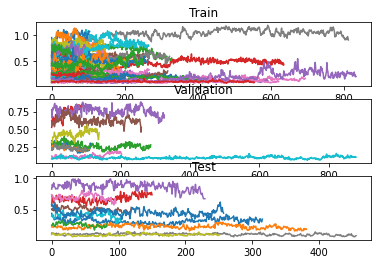

In [ ]:
agg_losses = photos.groupby("original_index")['Loss'].apply(list)
agg_frame_nr = photos.groupby("original_index")['Frame_nr'].apply(list)

fig, (ax1, ax2, ax3) = plt.subplots(3)

for i, values in agg_losses.items():
    if i in train_idx:
        ax1.plot(values)
    if i in val_idx:
        ax2.plot(values)
    if i in test_idx:
        ax3.plot(values)

ax1.set_title("Train")
ax2.set_title("Validation")
ax3.set_title("Test")
plt.show()

In [ ]:
dir_to_zip = '/content/lightning_logs/version_2' 
output_filename = 'log.zip'
os.system( "zip -r {} {}".format( output_filename , dir_to_zip ) )
files.download( output_filename )

In [ ]:

gc.collect()

torch.cuda.empty_cache()

In [ ]:
with torch.no_grad():
    m = nn.Sigmoid()
    input = torch.randn(16, 8)
    target = torch.empty(16, 8).random_(2)
    preds = m(input)
    preds_ = torch.ge(preds, torch.Tensor(thresholds

tensor([[ True, False,  True,  True, False,  True,  True,  True],
        [ True, False,  True, False,  True,  True,  True,  True],
        [ True, False,  True,  True,  True,  True,  True,  True],
        [ True, False,  True, False,  True,  True,  True,  True],
        [ True, False,  True,  True,  True,  True,  True,  True],
        [False, False, False,  True,  True,  True,  True,  True],
        [False, False,  True,  True,  True,  True,  True,  True],
        [False, False, False,  True,  True,  True,  True,  True],
        [False, False, False,  True,  True,  True,  True,  True],
        [ True, False,  True,  True,  True,  True,  True,  True],
        [ True, False, False,  True,  True,  True,  True,  True],
        [ True, False, False,  True,  True,  True,  True,  True],
        [False, False,  True, False,  True,  True,  True,  True],
        [ True, False,  True, False,  True,  True,  True,  True],
        [ True, False, False,  True,  True,  True,  True,  True],
        [ 

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir lightning_logs/

Output hidden; open in https://colab.research.google.com to view.